In [1]:
using MDToolbox
using Plots

nmodel = 50

50

In [2]:
function make_merged_T(ids, T, p, nmodel)
    ret_T = zeros(nmodel, nmodel)
    ret_p = zeros(nmodel)
    for i in 1:length(ids)
        i_state = ids[i][1]
        for j in 1:length(ids)
            j_state = ids[j][1]
            ret_T[i_state, j_state] += T[i, j]
        end

        ret_p[i_state] += p[i]
    end

    for i in 1:nmodel
        if sum(ret_T[i, :]) <= 1e-100
            continue 
        end
        ret_T[i, :] ./= sum(ret_T[i, :])
    end

    return ret_T, ret_p
end

make_merged_T (generic function with 1 method)

In [3]:
using BSON: @save, @load
@load "arg_id_10_baumwelch.bson" true_T true_pi_i T learned_T learned_pi_i obs_list log_emission ids nid

In [4]:
t, p = make_merged_T(ids, learned_T, learned_pi_i, nmodel)

([0.12991828597363828 0.0023333149755844504 … 0.018102567688708444 0.035292410657213676; 0.0017460548308376558 0.03206221804157563 … 0.025748834635269207 0.1053907902203638; … ; 0.01168923099647682 0.04922770293832415 … 0.06483846683126636 0.01497870639098169; 0.023144549762924044 0.11196941784894149 … 0.00836572751168227 0.013122974352058893], [0.01023299580441431, 0.031141890755547717, 0.07132850392849072, 0.014671666967110364, 0.003937853259581646, 0.008780829778708032, 0.008835157829452033, 0.03260841410405859, 0.004302861733333174, 0.004747711517189058  …  0.012617725473539088, 0.006940485155366227, 0.016762669305364235, 0.018515413597916575, 0.015212484378948649, 0.014041380234349607, 0.013440433491718856, 0.02774570448229436, 0.016639062517200147, 0.02176163202341805])

In [5]:
Ts = []
Ps = []

nsample = 25

for i = 1:nsample
    @load "arg_id_$(i)_baumwelch.bson" true_T true_pi_i T learned_T learned_pi_i obs_list log_emission ids nid
    t, p = make_merged_T(ids, learned_T, learned_pi_i, nmodel)
    push!(Ts, t)
    push!(Ps, p)
end

In [6]:
@load "../../data/t1r/t1r.bson" T pi_i centroid
#r = BSON.load("../data/t1r/t1r.bson"
true_T = deepcopy(T)
true_pi_i = deepcopy(pi_i);

In [7]:
pp = msmplot(true_T, pi_i=true_pi_i, x=centroid[:, 1], y=centroid[:, 2], 
            nodesize=1.2, edgewidth_scale=8.0, arrow_scale=0.001, 
            dpi=300)

In [8]:
pp = msmplot(Ts[1], pi_i=Ps[1], x=centroid[:, 1], y=centroid[:, 2], 
            nodesize=1.2, edgewidth_scale=8.0, arrow_scale=0.001, 
            dpi=300)

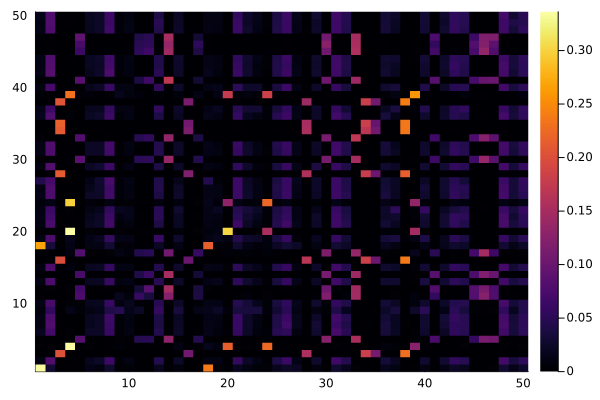

In [9]:
heatmap(true_T)

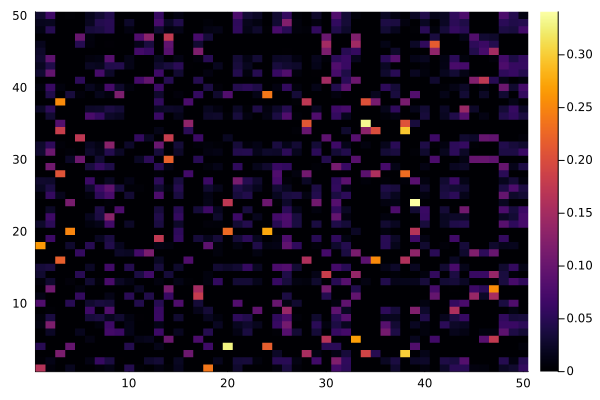

In [10]:
heatmap(Ts[1])

In [11]:
ii = round.(Int, collect(range(3, stop=46, length=5)))

r = Matrix{Float64}(undef, nsample, 5*5)
r_true = Matrix{Float64}(undef, 1, 5*5)
icount = 0
for i in ii
    for j in ii
        icount += 1
        r_true[1, icount] = true_T[i, j]
        for isample = 1:nsample
            r[isample, icount] = Ts[isample][i, j]
        end
    end
end

In [12]:
ii

5-element Vector{Int64}:
  3
 14
 24
 35
 46

In [13]:
histogram(r, bins=range(0, stop=1,length=100), label=nothing, layout = 25, xlims=(-0.1, 1.1), framestyle=:box, size=(1100, 550), dpi=300)
histogram!(r_true, bins=range(0, stop=1,length=30), label=nothing, layout = 25, xlims=(-0.1, 1.1), lims=(-0.1, 4.0), framestyle=:box, size=(1100, 550), dpi=300, color=:red)

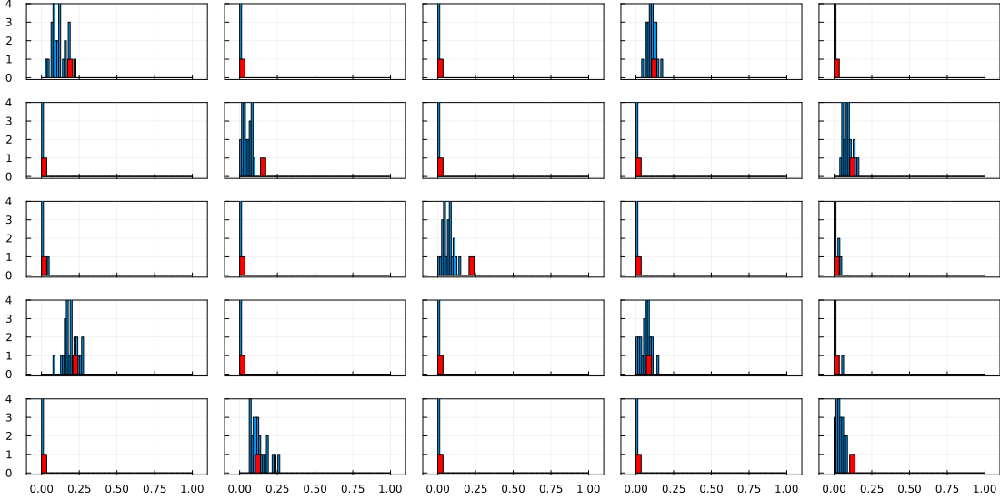

In [14]:
histogram(r, bins=range(0, stop=1,length=80), label=nothing, layout = 25, xlims=(-0.1, 1.1), framestyle=:box, size=(1100, 550), dpi=300)
pp = histogram!(r_true, bins=range(0, stop=1,length=30), label=nothing, layout = 25, xlims=(-0.1, 1.1), lims=(-0.1, 4.0), framestyle=:box, size=(1100, 550), dpi=300, color=:red, link=:both, 
    right_margin=Plots.Measures.Length(:mm, -3), left_margin=Plots.Measures.Length(:mm, 0),
    top_margin=Plots.Measures.Length(:mm, -1))

for i=1:20
    plot!(pp[i],xformatter=_->"")
end

for i = 0:24
    if mod(i, 5) != 0
        plot!(pp[i+1],yformatter=_->"")
    end
end

pp

In [15]:
savefig(pp, "plot.png")

"/data/yasu/seica/01_psudo_test/04_confidence_interval_radius_25/plot.png"